# Siamese Net Example

The siamese network is a method for training a distance function discriminatively.  Its use is popularized in many facial detection/recognition models including ones developed by Facebook and Google.  The basic idea is to run a deep net using pairs of images describing either matched or unmatched pairs.  The same network is run separately for the left and right images, but the loss is computed on the pairs of images rather than a single image.  This is done by making use of the "batch" dimension of the input tensor, and computing loss on interleaved batches.  If the left image is always the even idx (0, 2, 4, ...) and the right image is always the odd idxs, (1, 3, 5, ...), then the loss is computed on the alternating batches: `loss = output[::2] - output[1::2]`, for instance.  By feeding in pairs of images that are either true or false pairs, the output of the networks should try to push similar matching pairs closer to together, while keeping unmatched pairs farther away.

This package shows how to train a siamese network using Lasagne and Theano and includes network definitions for state-of-the-art networks including: DeepID, DeepID2, Chopra et. al, and Hani et. al.  We also include one pre-trained model using a custom convolutional network.

We are releasing all of this to the community in the hopes that it will encourage more models to be shared and appropriated for other possible uses.  The framework we share here should allow one to train their own network, compute results, and visualize the results.  We encourage the community to explore its use, submit pull requests on any issues within the package, and to contribute pre-trained models.

In this notebook, we explore a pretrained siamese network and show how it can be used for face verification, or determining whether two images contain the same face or not.  We also show an exploratory visualization of the learned siamese net embedding on the entire LFW dataset.

### Parag K. Mital, Copyright Kadenze, Inc., Jan 2016

In [1]:
"""Requires:
Lasagne 0.2.dev1, Theano 0.7.0, numpy-1.10.4, bson-0.4.1,
scipy-0.17.0, sklearn, dlib, pymongo, python 3.4.0+"""
import os
import pickle
import numpy as np
import siamese_net as sn
import lasagne
import theano
import theano.tensor as T
%matplotlib inline
import matplotlib.pyplot as plt

Using gpu device 0: GeForce GTX 780 (CNMeM is disabled, cuDNN 5005)


### Create a dataset object which we use to load the LFW dataset and optionally apply cropping, augmenting, etc...

In [2]:
n_files_per_person = 2
import datasets as D
ds = D.Datasets(
    n_files_per_person=n_files_per_person,
    b_augment_w_affine=False,
    b_augment_w_flips=False,
    resolution=(50, 50),
    crop_factor=0.5
)

In [3]:
lfwds = ds.get_parsed_dataset(dataset='lfw')

### This object has 2 keys defining all of the images of LFW and their labels:

In [4]:
lfwds.keys()

['images', 'target']

### The shape of the image array is [N x C x W x H], and the targets, [N, ]

In [5]:
lfwds['images'].shape, lfwds['target'].shape

((3360L, 3L, 50L, 50L), (3360L,))

### The awkward dimensions require us to roll the channel axis from 0 to 2 in order to view it:

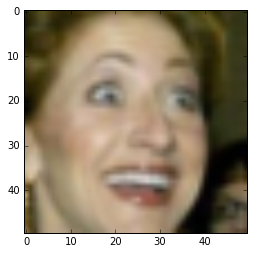

In [6]:
plt.imshow(np.rollaxis(lfwds['images'][100,...], 0, 3))

### The LFW dataset has already been aligned for us.  We can easily see this by looking at the mean of the dataset

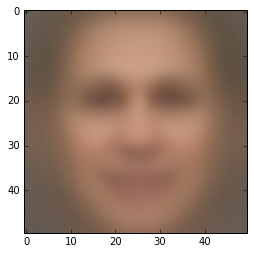

In [7]:
mean_img = np.mean(lfwds['images'], axis=0).astype(np.uint8)
plt.imshow(np.rollaxis(mean_img, 0, 3))

### We can also use a helper function inside of siamese_net to create a montage of the entire dataset:

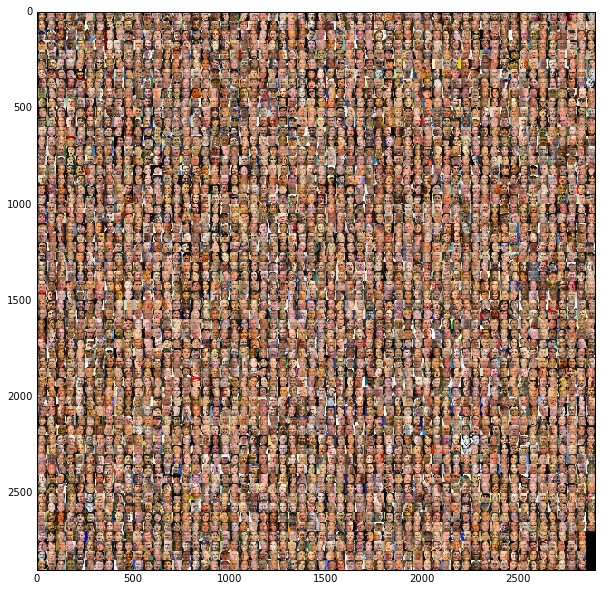

In [8]:
fig, ax = plt.subplots(1,1,figsize=(22,10))
ax.imshow(np.rollaxis(sn.montage(lfwds['images']), 0, 2))

### We can also crop the faces a bit to avoid seeing the background

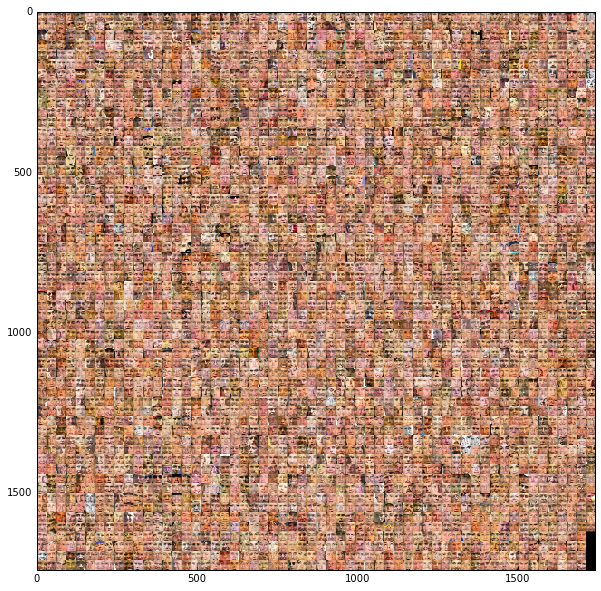

In [9]:
fig, ax = plt.subplots(1,1,figsize=(22,10))
crop = 10
ax.imshow(np.rollaxis(sn.montage(lfwds['images'][:,:,crop:-crop,crop:-crop]), 0, 2))

### Load a pre-trained siamese net predictor

In [10]:
net = sn.SiameseNetPredictor(filename='testmodel.pkl',
                             images=lfwds['images'])

{'spatial_transform': False, 'n_epochs': 20, 'distance_fn': 'l2', 'n_files': 2, 'nonlinearity': 'rectify', 'learning_rate': 0.001, 'hyperparameter_margin': 2.0, 'batch_size': 200, 'dataset': 'lfw', 'b_convert_to_grayscale': 0, 'crop': 0.5, 'model_type': 'custom', 'n_features': 40, 'hyperparameter_threshold': 5.0, 'resolution': (50, 50), 'normalization': '-1:1'}
(3360L, 3L, 50L, 50L)


### Visualize the output of the network at any layer

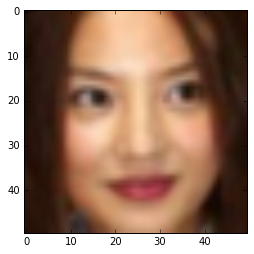

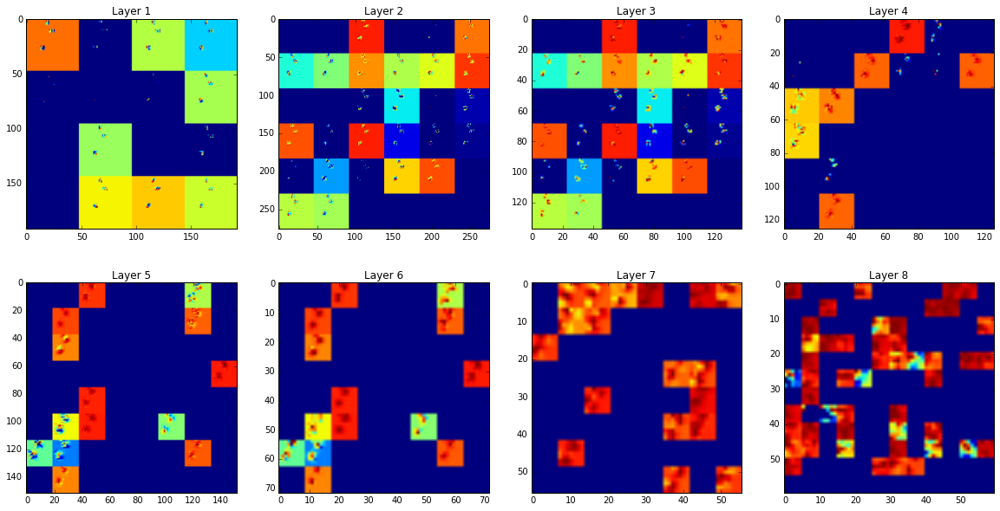

In [11]:
image_i = 1
n_layers = 8

# Visualize an image from the dataset
images = np.rollaxis(lfwds['images'], 1, 4)
fig, ax = plt.subplots(1,1,figsize=(5,4))
ax.imshow(images[image_i])

fig, axs = plt.subplots(2,4,figsize=(20,10))
for layer_i in range(n_layers):
    # Visualize the first layer's activations
    ax = axs[layer_i//4][layer_i%4]
    ax.imshow(
        sn.montage(
            net.features_for_layer(
                net.preprocess(lfwds['images'][image_i,...][np.newaxis]),layer_i+1)[0]))
    ax.set_title('Layer %d' % (layer_i+1))

### Calculate the features of every image in our dataset

In [12]:
n_imgs = len(lfwds['images'])
features = [net.features(net.preprocess(
            img[np.newaxis, ...]).astype(np.float32))
            for img in lfwds['images'][:n_imgs]]
features = np.squeeze(np.array(features))

### Project features to smaller number of dimensions

In [13]:
from sklearn import manifold
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
mapper = manifold.TSNE(n_components=2)
transform = mapper.fit_transform(features[:n_imgs,...].copy())

### Visualize it

C:\Users\localadmin\Anaconda64\lib\site-packages\matplotlib\figure.py:397: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


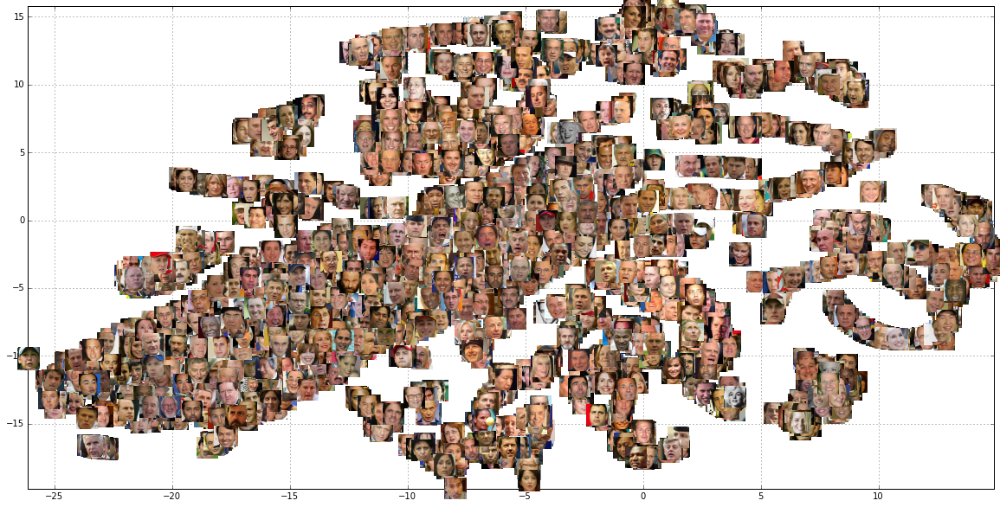

In [14]:
fig,ax = plt.subplots(figsize=(20,10))
feat1, feat2 = 0, 1
# ax.scatter(transform[:,feat1], transform[:,feat2], marker='+', alpha=0.5, s=300)
for img in range(n_imgs):
    box = AnnotationBbox(OffsetImage(np.rollaxis(lfwds['images'][img], 0, 3), zoom=0.5),
                  transform[img,[feat1,feat2]], frameon=False, pad=0.0)
    ax.add_artist(box)
ax.grid(True)
scale = 1.0
ax.set_xlim([np.min(transform[:,feat1])*scale, np.max(transform[:,feat1])*scale])
ax.set_ylim([np.min(transform[:,feat2])*scale, np.max(transform[:,feat2])*scale])
fig.show()

### Since the features have been trained to optimize the distance between faces, the background should mostly be irrelvant to the feature space.  Let's crop the images a bit closer (since the images are all centered on the faces already), and then see how the manifold looks like:

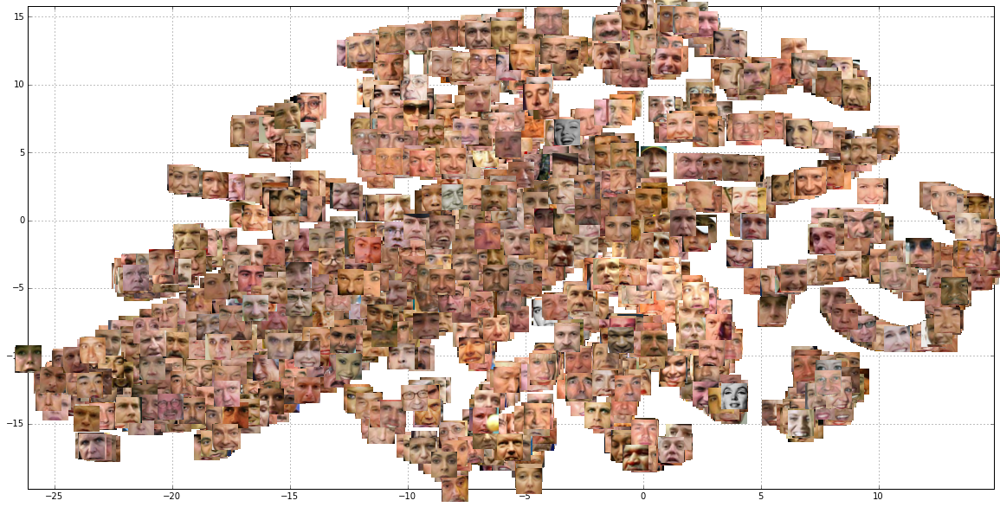

In [15]:
fig,ax = plt.subplots(figsize=(20,10))
feat1, feat2 = 0, 1
crop = 10
for img in range(n_imgs):
    box = AnnotationBbox(OffsetImage(
            np.rollaxis(lfwds['images'][img], 0, 3)[crop:-crop, crop:-crop, :], zoom=1.0),
                  transform[img,[feat1,feat2]], frameon=False, pad=0.0)
    ax.add_artist(box)
ax.grid(True)
scale = 1.0
ax.set_xlim([np.min(transform[:,feat1])*scale, np.max(transform[:,feat1])*scale])
ax.set_ylim([np.min(transform[:,feat2])*scale, np.max(transform[:,feat2])*scale])
fig.show()

### Test whether two images contain the same person or not ~ 90% accuracy

Same people


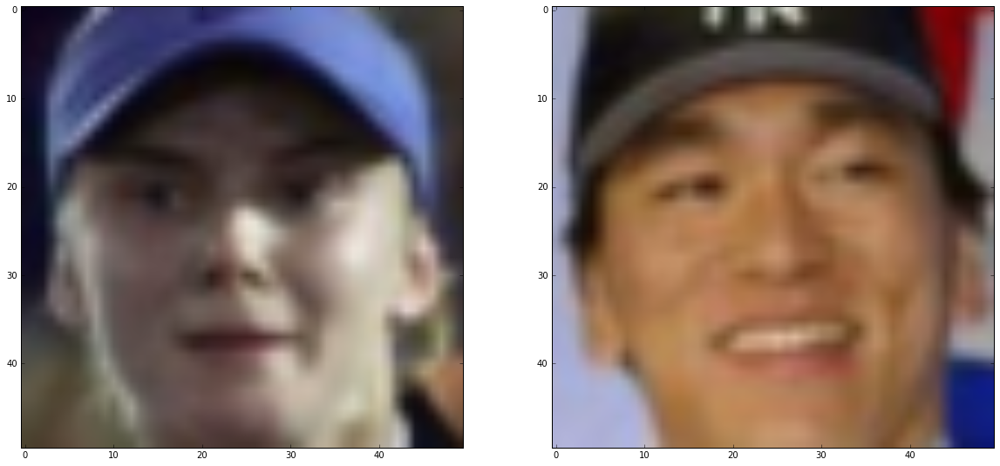

In [22]:
fig,[ax1,ax2] = plt.subplots(1,2,figsize=(20,10))
idx1 = 2
idx2 = 5
ax1.imshow(np.rollaxis(lfwds['images'][idx1], 0, 3))
ax2.imshow(np.rollaxis(lfwds['images'][idx2], 0, 3))
i1 = net.preprocess(lfwds['images'][idx1][np.newaxis]).astype(np.float32)
i2 = net.preprocess(lfwds['images'][idx2][np.newaxis]).astype(np.float32)
i = np.concatenate((i1,i2), axis=0)
if net.predict(i) == 1.0:
    print('Same people')
else:
    print('Different people')

### We can visualize what the gradients are for any layer's maximal activations with respect to the image.  

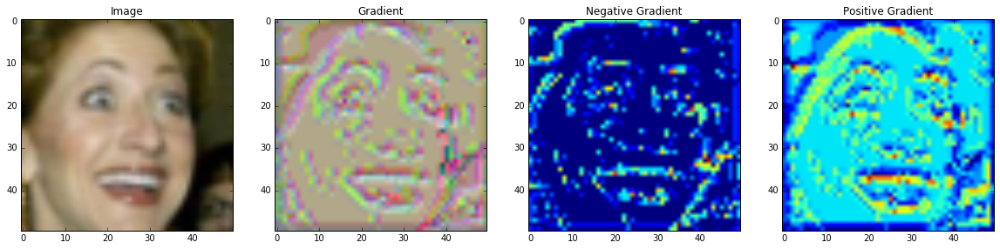

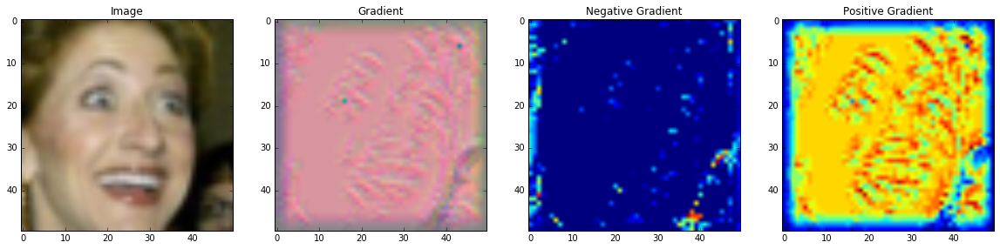

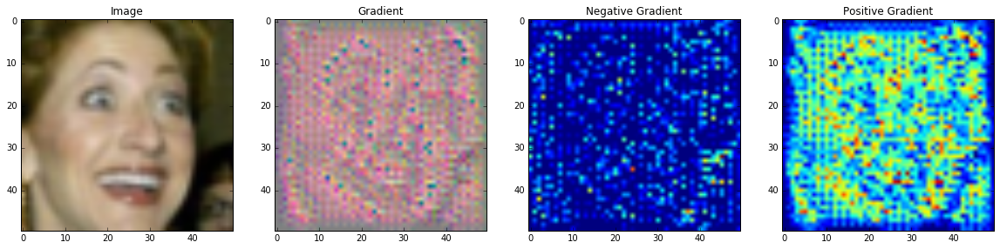

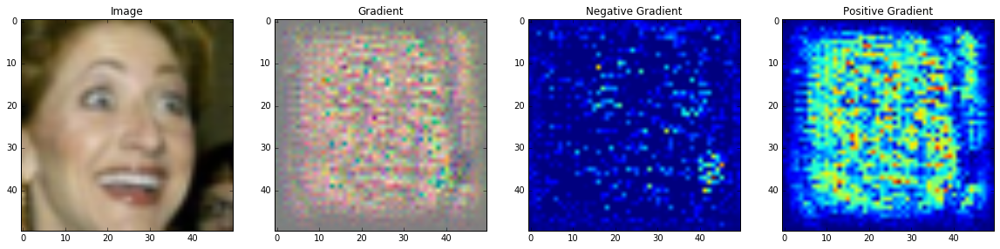

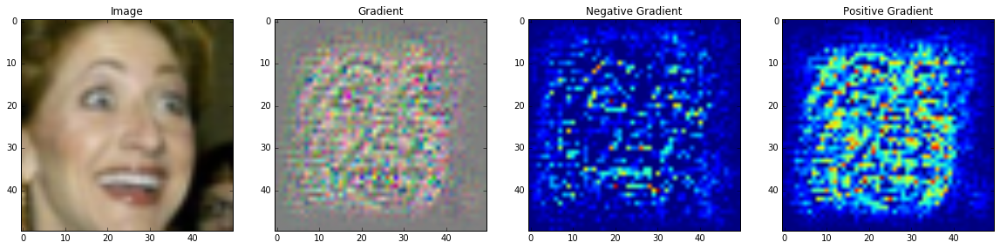

...

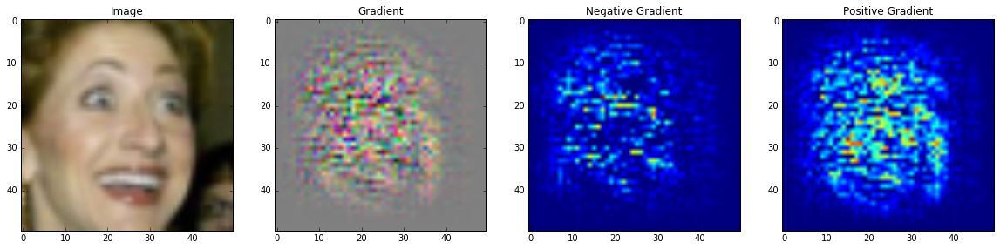

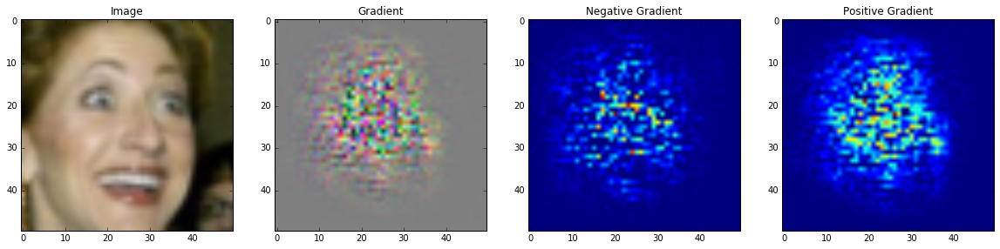

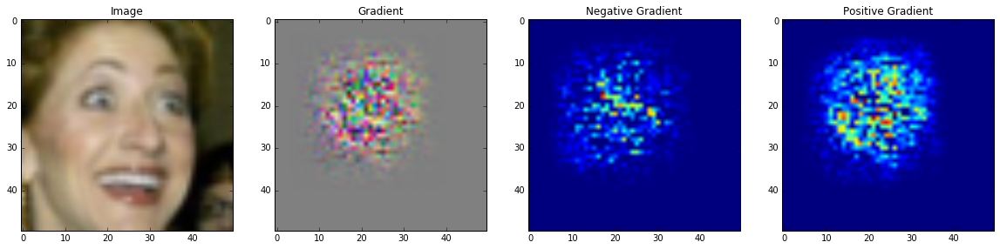

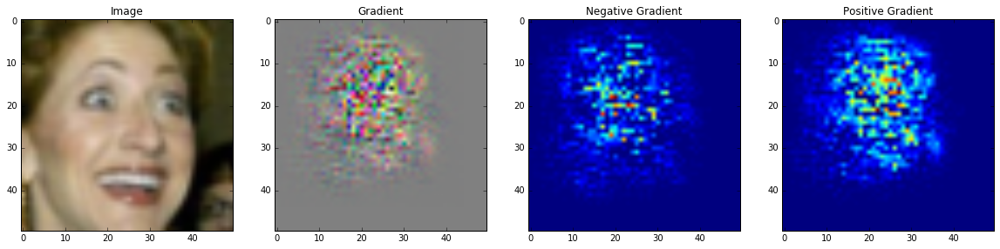

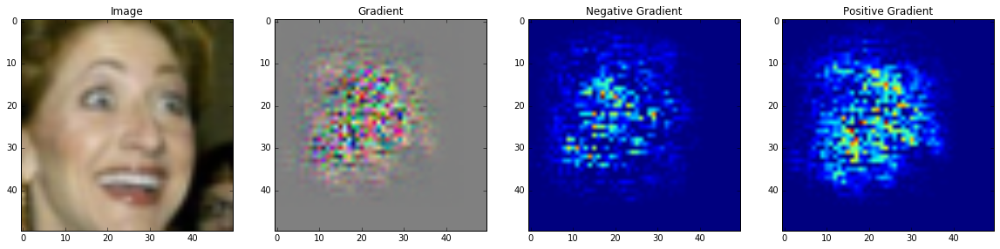

In [17]:
img = lfwds['images'][100]
layers = lasagne.layers.get_all_layers(net.net.model)[1:]
for layer in layers:
    inp = net.net.l_in.input_var
    outp = lasagne.layers.get_output(layer)
    max_outp = T.max(outp, axis=1)
    grad = theano.grad(max_outp.sum(), wrt=inp)
    fn = theano.function([inp], [grad])
    i = np.rollaxis(np.array(fn(img[np.newaxis])[0][0]), 0, 3)
    i /= np.std(i)
    fig, axs = plt.subplots(1,4,figsize=(20,10))
    axs[0].imshow(np.rollaxis(img, 0, 3))
    axs[0].set_title('Image')
    axs[1].imshow((i * 32 + 128).astype(np.uint8))
    axs[1].set_title('Gradient')
    axs[2].imshow(np.mean((np.abs(np.minimum(0, i)) * 64).astype(np.uint8), axis=2))
    axs[2].set_title('Negative Gradient')
    axs[3].imshow(np.mean((np.maximum(0, i) * 64).astype(np.uint8), axis=2))
    axs[3].set_title('Positive Gradient')